<a href="https://colab.research.google.com/github/SalamUddin844/Cataract-Detection-from-OCT-images-using-Deep-learing/blob/main/Cataract_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Library**

In [ ]:
import tensorflow as tf
import os
import numpy as np
import pandas as pd
import random
import time
import cv2
from tqdm import tqdm
import glob
from tensorflow.keras.utils import plot_model
from tensorflow.keras.regularizers import l1, l2
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras import callbacks
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation,Input, DepthwiseConv2D, UpSampling2D, Concatenate,BatchNormalization
from keras.models import Model
from tensorflow.keras.models import load_model
from keras.applications import InceptionV3,InceptionResNetV2,Xception,MobileNetV2,ResNet50V2,EfficientNetB3,DenseNet169
from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.io import imread
import keras.utils as image
import seaborn as sns
from tensorflow.keras.models import Sequential
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.image as mpimg
from PIL import Image
from sklearn.model_selection import train_test_split
import shutil
sns.set()
%matplotlib inline

# **Connect to Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Unzip Dataset**

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/cataract.zip

Archive:  /content/drive/MyDrive/Colab_Notebooks/cataract.zip
   creating: cataract/test/
   creating: cataract/test/cataract/
  inflating: cataract/test/cataract/_0_4015166.jpg  
  inflating: cataract/test/cataract/_1_5346540.jpg  
  inflating: cataract/test/cataract/_1_7703314.jpg  
  inflating: cataract/test/cataract/_10_3215668.jpg  
  inflating: cataract/test/cataract/_11_7158929.jpg  
  inflating: cataract/test/cataract/_12_5233869.jpg  
  inflating: cataract/test/cataract/_13_3987009.jpg  
  inflating: cataract/test/cataract/_14_7805520.jpg  
  inflating: cataract/test/cataract/_15_7471583.jpg  
  inflating: cataract/test/cataract/_16_1907643.jpg  
  inflating: cataract/test/cataract/_16_8423210.jpg  
  inflating: cataract/test/cataract/_17_1497593.jpg  
  inflating: cataract/test/cataract/_17_6538881.jpg  
  inflating: cataract/test/cataract/_18_3816222.jpg  
  inflating: cataract/test/cataract/_18_952924.jpg  
  inflating: cataract/test/cataract/_19_9976222.jpg  
  inflating: 

# **Data Frame Conversion**

In [ ]:
data_dir = "/content/cataract/train"

train_valid_cataract_df = pd.DataFrame(columns=['filepaths', 'labels'])
train_valid_normal_df = pd.DataFrame(columns=['filepaths', 'labels'])

cataract_label = 'cataract'
normal_label = 'normal'


cataract_files = os.listdir(os.path.join(data_dir, "cataract"))
normal_files = os.listdir(os.path.join(data_dir, "normal"))


train_valid_cataract_df['filepaths'] = [os.path.join(data_dir, "cataract", filename) for filename in cataract_files]
train_valid_cataract_df['labels'] = cataract_label


train_valid_normal_df['filepaths'] = [os.path.join(data_dir, "normal", filename) for filename in normal_files]
train_valid_normal_df['labels'] = normal_label


In [ ]:
train_valid_df = pd.concat([train_valid_cataract_df], ignore_index=True)
train_valid_df = pd.concat([train_valid_df, train_valid_normal_df], ignore_index=True)

train_valid_df = train_valid_df.sample(frac=1, random_state=42)
label_counts = train_valid_df['labels'].value_counts()

label_counts

labels
normal      953
cataract    928
Name: count, dtype: int64

In [ ]:
data_dir = "/content/cataract/test"

test_cataract_df = pd.DataFrame(columns=['filepaths', 'labels'])
test_normal_df = pd.DataFrame(columns=['filepaths', 'labels'])

cataract_label = 'cataract'
normal_label = 'normal'


cataract_files = os.listdir(os.path.join(data_dir, "cataract"))
normal_files = os.listdir(os.path.join(data_dir, "normal"))


test_cataract_df['filepaths'] = [os.path.join(data_dir, "cataract", filename) for filename in cataract_files]
test_cataract_df['labels'] = cataract_label


test_normal_df['filepaths'] = [os.path.join(data_dir, "normal", filename) for filename in normal_files]
test_normal_df['labels'] = normal_label


In [ ]:
test_df = pd.concat([test_cataract_df], ignore_index=True)
test_df = pd.concat([test_df, test_normal_df], ignore_index=True)

test_df = test_df.sample(frac=1, random_state=42)
label_counts = test_df['labels'].value_counts()

label_counts

labels
normal      121
cataract    110
Name: count, dtype: int64

# **Data Distribution**

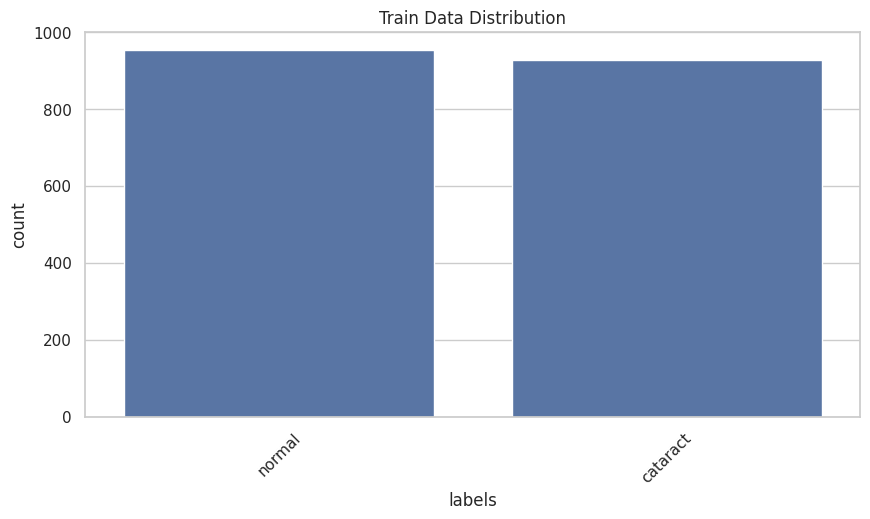

In [ ]:
plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
ax = sns.countplot(data=train_valid_df, x='labels')

plt.title('Train Data Distribution')
plt.xticks(rotation=45)
plt.show()

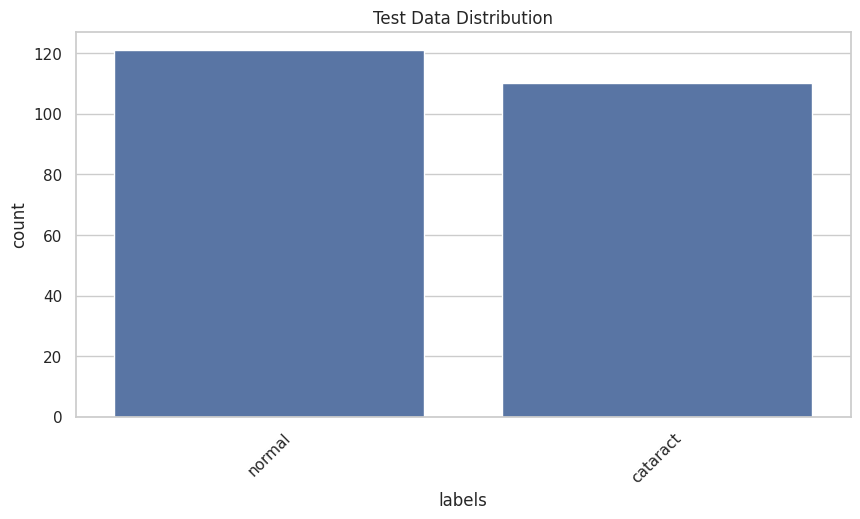

In [ ]:
plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
ax = sns.countplot(data=test_df, x='labels')

plt.title('Test Data Distribution')
plt.xticks(rotation=45)
plt.show()

# **Pi-plot of data distribution**

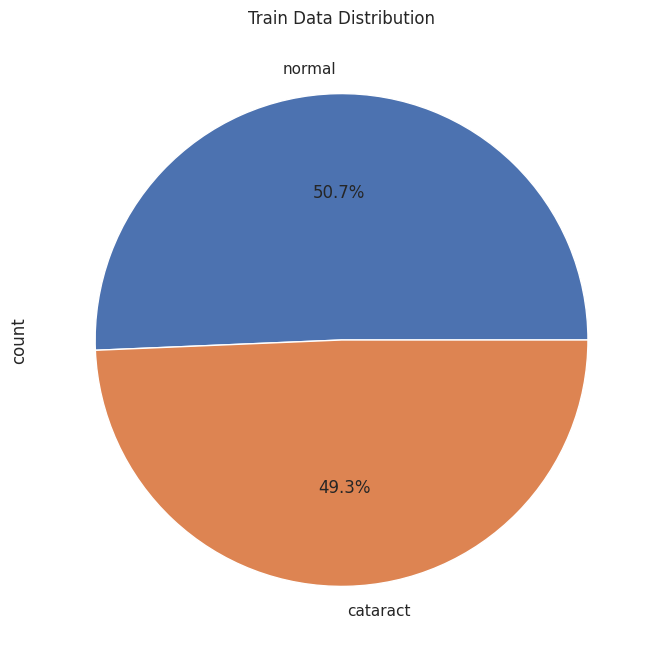

In [ ]:
plt.figure(figsize=(10, 8))
train_valid_df['labels'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Train Data Distribution')
plt.show()

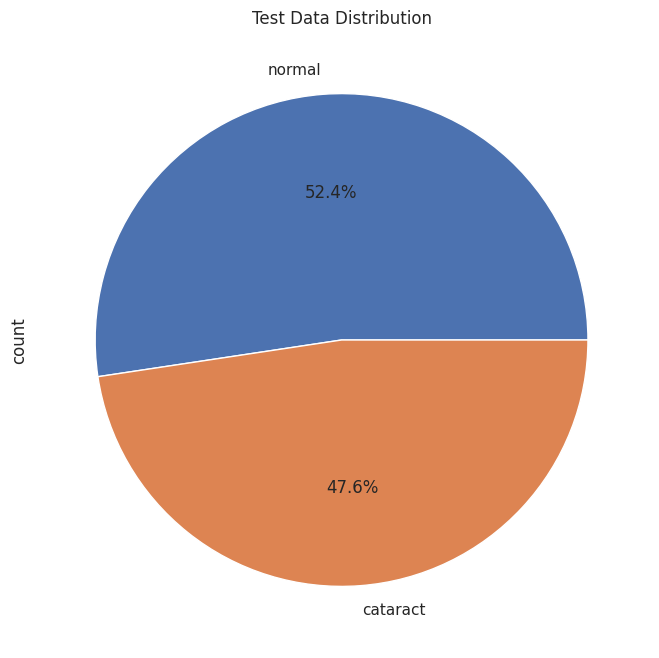

In [ ]:
plt.figure(figsize=(10, 8))
test_df['labels'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Test Data Distribution')
plt.show()

# **data Visualization**

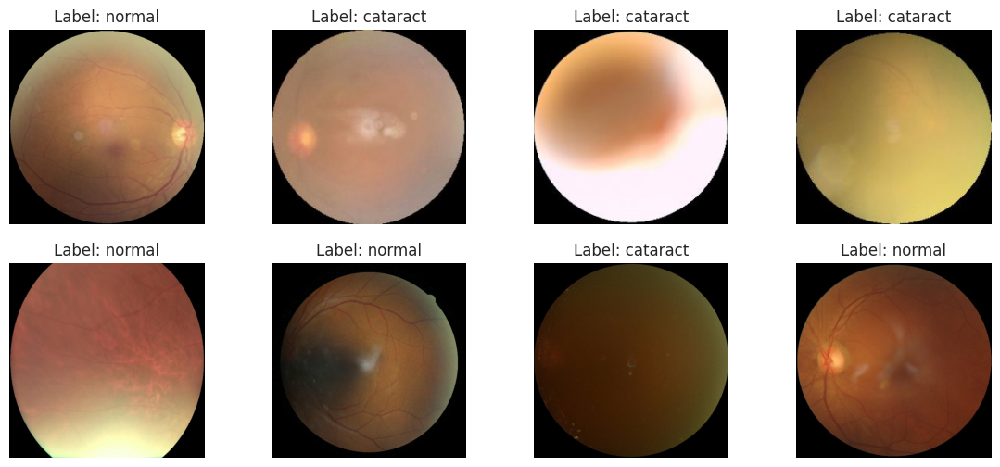

In [ ]:
def display_images(df, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(14, 6))
    for r in range(rows):
        for c in range(cols):
            index = r * cols + c
            if index < len(df):
                image_path = df.iloc[index]['filepaths']
                label = df.iloc[index]['labels']
                img = Image.open(image_path)
                axes[r, c].imshow(img)
                axes[r, c].set_title(f'Label: {label}')
                axes[r, c].axis('off')
            else:
                axes[r, c].axis('off')

    plt.show()

rows = 2
cols = 4

display_images(train_valid_df, rows, cols)

# Data Preprocessing

# **Data Augmentation**

# **Train Set**

In [ ]:
train_df, valid_df = train_test_split(train_valid_df,  train_size= 0.8, shuffle= True, random_state= 123, stratify= train_valid_df['labels'])

In [ ]:
def scalar(img):
        return img

train_generator = ImageDataGenerator(preprocessing_function = scalar,
                                     horizontal_flip = True)

test_generator = ImageDataGenerator(preprocessing_function = scalar)

In [ ]:
train_set = train_generator.flow_from_dataframe( train_df,
                                        x_col= 'filepaths',
                                        y_col= 'labels',
                                        target_size= (224, 224),
                                        class_mode= 'categorical',
                                        color_mode= 'rgb',
                                        shuffle= True,
                                        batch_size= 40
)

Found 1504 validated image filenames belonging to 2 classes.


# **validation set**

In [ ]:
valid_set = test_generator.flow_from_dataframe( valid_df,
                                       x_col= 'filepaths',
                                       y_col= 'labels',
                                       target_size= (224, 224),
                                       class_mode= 'categorical',
                                       color_mode= 'rgb',
                                       shuffle= True,
                                       batch_size= 40
)

Found 377 validated image filenames belonging to 2 classes.


# **test set**

In [ ]:
test_set = test_generator.flow_from_dataframe( test_df,
                                      x_col= 'filepaths',
                                      y_col= 'labels',
                                      target_size= (224, 224),
                                      class_mode= 'categorical',
                                      color_mode= 'rgb',
                                      shuffle= False,
                                      batch_size= 40
)

Found 231 validated image filenames belonging to 2 classes.


# **TL Models**

# **InceptionResNetV2**

In [ ]:
base_model = InceptionResNetV2(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(256, kernel_rel=0.016,gularizer=l2(), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)


output = Dense(2, activation='sigmoid')(x)
inceptionResNetV2_model = Model(inputs = base_model.input, outputs = output)
inceptionResNetV2_model.compile(Adamax(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
inceptionResNetV2_model.summary()
checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

219055592/219055592 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)   

# **Model Train**

In [ ]:
start_time = time.time()

history = inceptionResNetV2_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
38/38 [==============================] - ETA: 0s - loss: 6.4288 - accuracy: 0.9249
Epoch 1: val_accuracy improved from -inf to 0.86472, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


38/38 [==============================] - 163s 2s/step - loss: 6.4288 - accuracy: 0.9249 - val_loss: 8.7662 - val_accuracy: 0.8647
Epoch 2/40
38/38 [==============================] - ETA: 0s - loss: 4.7089 - accuracy: 0.9495
Epoch 2: val_accuracy did not improve from 0.86472
38/38 [==============================] - 31s 823ms/step - loss: 4.7089 - accuracy: 0.9495 - val_loss: 14.9276 - val_accuracy: 0.7878
Epoch 3/40
38/38 [==============================] - ETA: 0s - loss: 3.7884 - accuracy: 0.9608
Epoch 3: val_accuracy improved from 0.86472 to 0.95225, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5
38/38 [==============================] - 47s 1s/step - loss: 3.7884 - accuracy: 0.9608 - val_loss: 3.8388 - val_accuracy: 0.9523
Epoch 4/40
38/38 [==============================] - ETA: 0s - loss: 3.1208 - accuracy: 0.9714
Epoch 4: val_accuracy improved from 0.95225 to 0.96817, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5
38/38 [====

# **Training , Validation accuracy and loss Visualiztion**

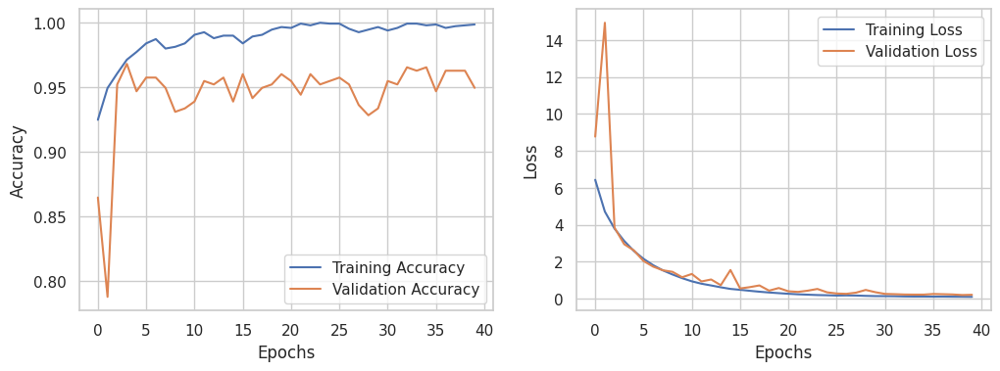

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# **classification report**

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = inceptionResNetV2_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

6/6 [==============================] - 8s 854ms/step
Classification Report:
               precision    recall  f1-score   support

    cataract       0.95      1.00      0.97       110
      normal       1.00      0.95      0.97       121

    accuracy                           0.97       231
   macro avg       0.97      0.98      0.97       231
weighted avg       0.98      0.97      0.97       231



# **confusion matrix**

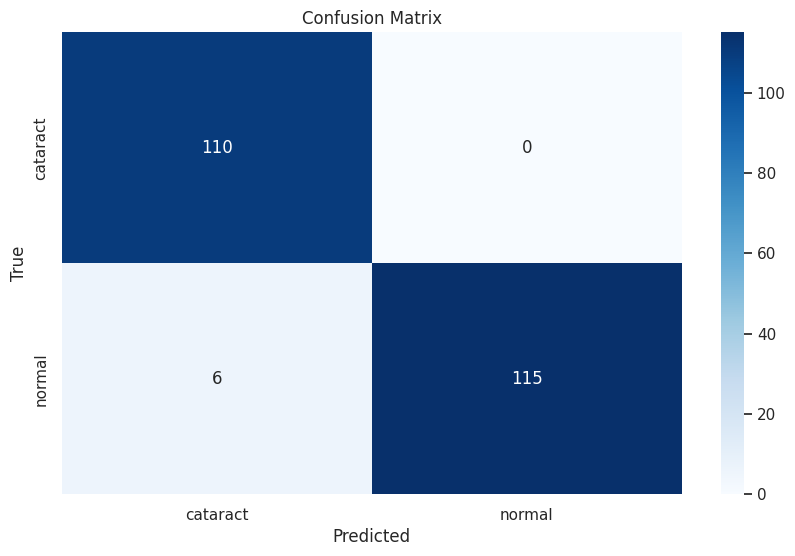

In [ ]:

confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# **Model Evalution**

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")


6/6 [==============================] - 1s 204ms/step - loss: 2.8195 - accuracy: 0.9870

----------------------------------------
----------------------------------------
Train Loss:          2.8590192794799805
Train Accuracy:      0.9867021441459656

----------------------------------------
----------------------------------------
Validation Loss:     2.9451487064361572
Validation Accuracy: 0.9681697487831116

----------------------------------------
----------------------------------------
Test Loss:           2.8195412158966064
Test Accuracy:       0.9870129823684692


# **Prediction**

1/1 [==============================] - 0s 42ms/step


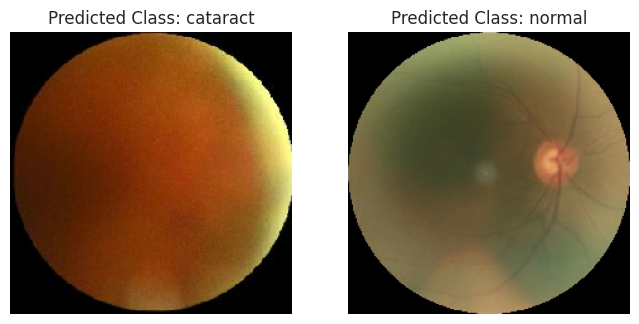

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'normal']

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5'

image_paths = [
    '/content/cataract/test/cataract/_14_7805520.jpg',
    '/content/cataract/test/normal/2329_right.jpg',
]

predict_and_display_images(image_paths, model_path)


# **Feature Map Visualization**

1/1 [==============================] - 0s 56ms/step


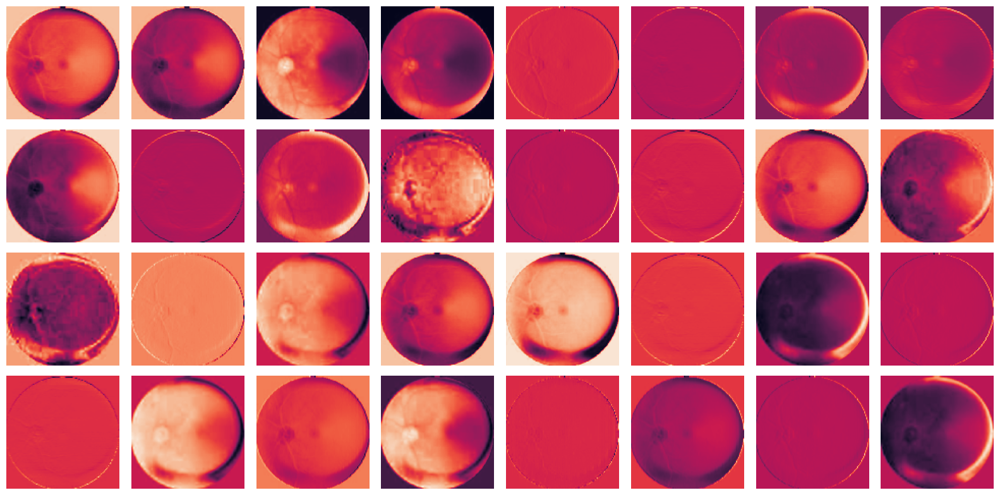

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'conv2d_10'
img_path = '/content/cataract/test/cataract/_16_8423210.jpg'

visualize_activation_maps(model, img_path, layer_name)


# **Image Segmentation**

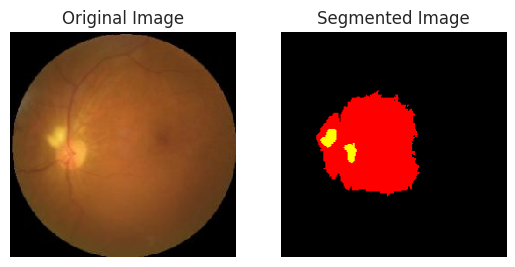

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/cataract/test/cataract/_30_4231084.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.65
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()


# **Computational Tomography**

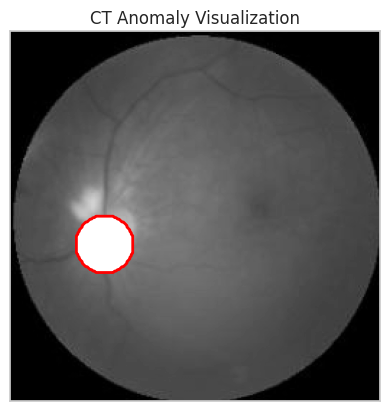

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)

    anomaly_location = (
        np.random.randint(anomaly_size, grayscale_image.shape[0] - anomaly_size),
        np.random.randint(anomaly_size, grayscale_image.shape[1] - anomaly_size)
    )

    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0

    return grayscale_image, anomaly_mask

def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/cataract/test/cataract/_30_4231084.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


# **Xception**

In [ ]:
base_model = Xception(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(2, activation='sigmoid')(x)

Xception_model = Model(inputs = base_model.input, outputs = output)
Xception_model.compile(Adamax(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

Xception_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

83683744/83683744 [==============================] - 0s 0us/step
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 111, 111, 32)         864       ['input_4[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 111, 111, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati

# **Model Train**

In [ ]:
start_time = time.time()

history = Xception_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
38/38 [==============================] - ETA: 0s - loss: 6.5568 - accuracy: 0.9289
Epoch 1: val_accuracy improved from -inf to 0.65517, saving model to /content/drive/MyDrive/Colab_Notebooks/Xception_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


38/38 [==============================] - 81s 1s/step - loss: 6.5568 - accuracy: 0.9289 - val_loss: 5.7316 - val_accuracy: 0.6552
Epoch 2/40
38/38 [==============================] - ETA: 0s - loss: 4.2257 - accuracy: 0.9681
Epoch 2: val_accuracy improved from 0.65517 to 0.93103, saving model to /content/drive/MyDrive/Colab_Notebooks/Xception_model.h5
38/38 [==============================] - 30s 782ms/step - loss: 4.2257 - accuracy: 0.9681 - val_loss: 3.6340 - val_accuracy: 0.9310
Epoch 3/40
38/38 [==============================] - ETA: 0s - loss: 2.9609 - accuracy: 0.9767
Epoch 3: val_accuracy improved from 0.93103 to 0.94960, saving model to /content/drive/MyDrive/Colab_Notebooks/Xception_model.h5
38/38 [==============================] - 30s 793ms/step - loss: 2.9609 - accuracy: 0.9767 - val_loss: 2.5757 - val_accuracy: 0.9496
Epoch 4/40
38/38 [==============================] - ETA: 0s - loss: 2.1423 - accuracy: 0.9874
Epoch 4: val_accuracy improved from 0.94960 to 0.97613, saving mode

# **Training , Validation accuracy and loss Visualiztion**

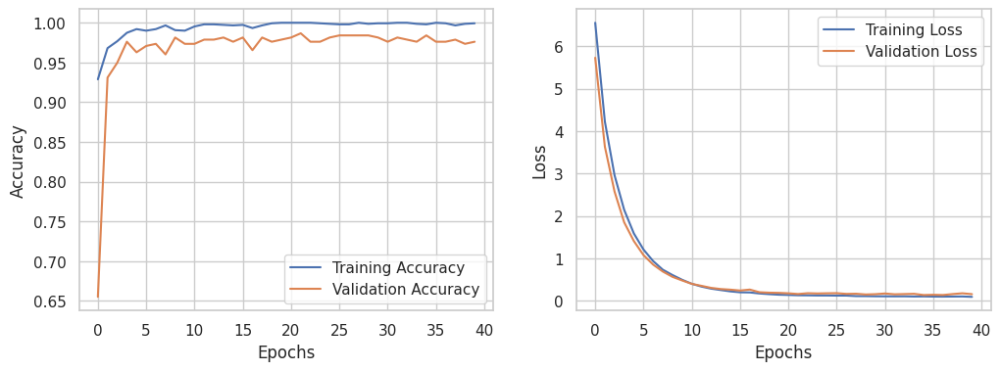

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# **classification report**

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = Xception_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

6/6 [==============================] - 5s 782ms/step
Classification Report:
               precision    recall  f1-score   support

    cataract       0.96      1.00      0.98       110
      normal       1.00      0.97      0.98       121

    accuracy                           0.98       231
   macro avg       0.98      0.98      0.98       231
weighted avg       0.98      0.98      0.98       231



# confusion **matrix**

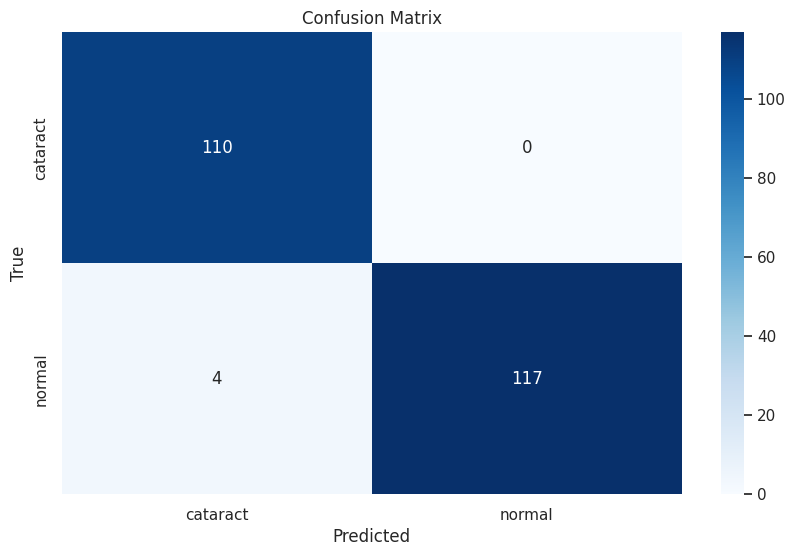

In [ ]:

confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# **Model Evalution**

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")

6/6 [==============================] - 1s 160ms/step - loss: 0.1611 - accuracy: 0.9827

----------------------------------------
----------------------------------------
Train Loss:          0.11087776720523834
Train Accuracy:      1.0

----------------------------------------
----------------------------------------
Validation Loss:     0.15784718096256256
Validation Accuracy: 0.9867374300956726

----------------------------------------
----------------------------------------
Test Loss:           0.16107060015201569
Test Accuracy:       0.9826839566230774


# **Feature map visualization**

1/1 [==============================] - 0s 40ms/step


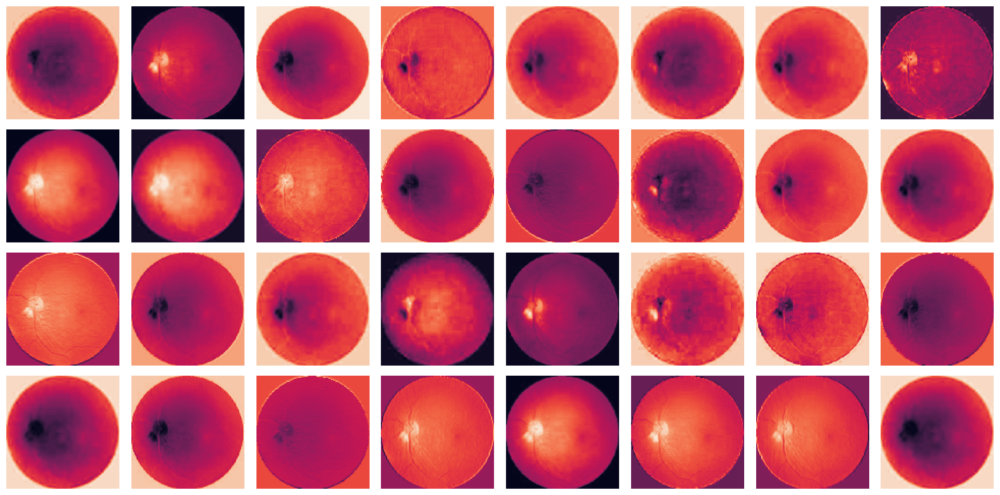

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'block1_conv1'
img_path = '/content/cataract/test/cataract/_30_8983681.jpg'

visualize_activation_maps(model, img_path, layer_name)


# **Prediction**

1/1 [==============================] - 0s 24ms/step


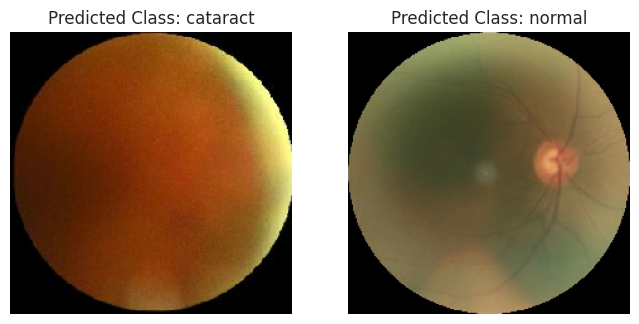

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'normal']

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5'

image_paths = [
    '/content/cataract/test/cataract/_14_7805520.jpg',
    '/content/cataract/test/normal/2329_right.jpg',
]

predict_and_display_images(image_paths, model_path)


# **Image segmentation**

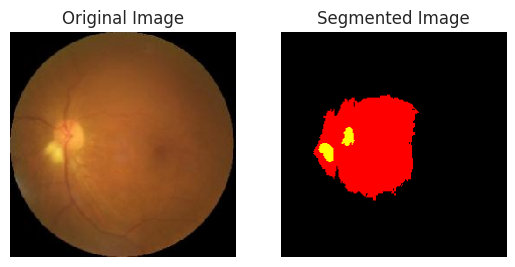

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/cataract/test/cataract/_30_8983681.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.65
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()

# **Computational Tomography**

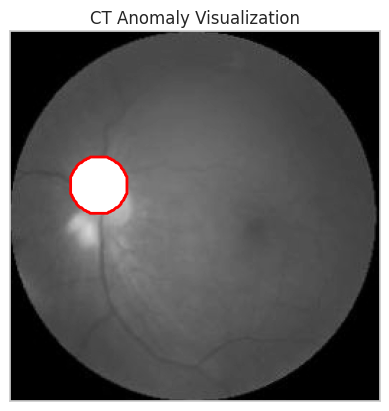

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)

    # Randomly generate anomaly location within the image bounds
    anomaly_location = (
        np.random.randint(anomaly_size, grayscale_image.shape[0] - anomaly_size),
        np.random.randint(anomaly_size, grayscale_image.shape[1] - anomaly_size)
    )

    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0

    return grayscale_image, anomaly_mask

def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    # Create a figure without axes
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/cataract/test/cataract/_30_8983681.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


# **DenseNet169**

In [ ]:
base_model = DenseNet169(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(2, activation='sigmoid')(x)

DenseNet169_model = Model(inputs = base_model.input, outputs = output)

DenseNet169_model.compile(Adamax(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

DenseNet169_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


51877672/51877672 [==============================] - 0s 0us/step
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_5[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati

# **Model train**

In [ ]:
start_time = time.time()

history = DenseNet169_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
38/38 [==============================] - ETA: 0s - loss: 4.8753 - accuracy: 0.9289
Epoch 1: val_accuracy improved from -inf to 0.49337, saving model to /content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


38/38 [==============================] - 159s 2s/step - loss: 4.8753 - accuracy: 0.9289 - val_loss: 12.0038 - val_accuracy: 0.4934
Epoch 2/40
38/38 [==============================] - ETA: 0s - loss: 2.2207 - accuracy: 0.9734
Epoch 2: val_accuracy improved from 0.49337 to 0.86207, saving model to /content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5
38/38 [==============================] - 30s 794ms/step - loss: 2.2207 - accuracy: 0.9734 - val_loss: 2.7475 - val_accuracy: 0.8621
Epoch 3/40
38/38 [==============================] - ETA: 0s - loss: 1.4024 - accuracy: 0.9734
Epoch 3: val_accuracy improved from 0.86207 to 0.97082, saving model to /content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5
38/38 [==============================] - 31s 801ms/step - loss: 1.4024 - accuracy: 0.9734 - val_loss: 1.4011 - val_accuracy: 0.9708
Epoch 4/40
38/38 [==============================] - ETA: 0s - loss: 0.9949 - accuracy: 0.9794
Epoch 4: val_accuracy did not improve from 0.97082
38/38 [=============

# **Training , Validation accuracy and loss Visualiztion**

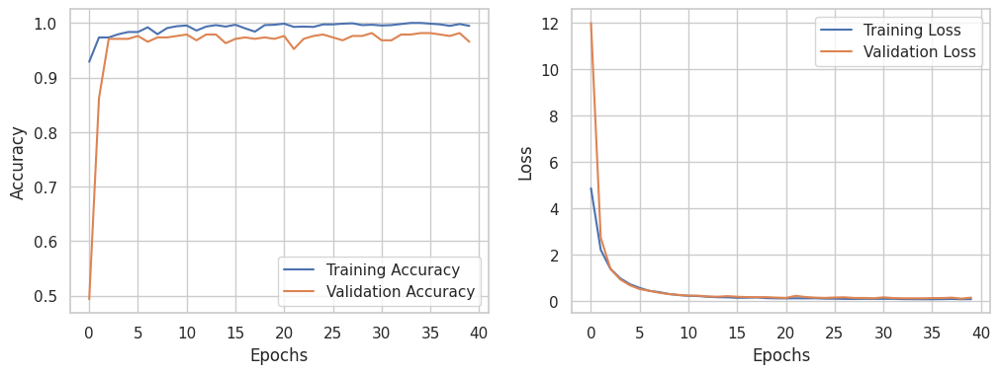

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# **classification report**

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = DenseNet169_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

6/6 [==============================] - 10s 1s/step
Classification Report:
               precision    recall  f1-score   support

    cataract       0.95      1.00      0.97       110
      normal       1.00      0.95      0.97       121

    accuracy                           0.97       231
   macro avg       0.97      0.98      0.97       231
weighted avg       0.98      0.97      0.97       231



# **confusion matrix**

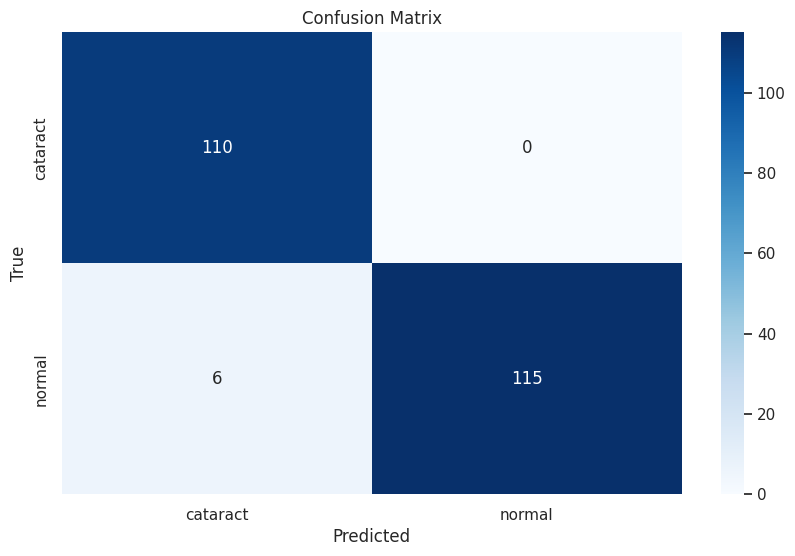

In [ ]:
confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# **Model Evalution**

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")

6/6 [==============================] - 1s 136ms/step - loss: 0.1357 - accuracy: 0.9827

----------------------------------------
----------------------------------------
Train Loss:          0.09127897769212723
Train Accuracy:      1.0

----------------------------------------
----------------------------------------
Validation Loss:     0.13447131216526031
Validation Accuracy: 0.9814323782920837

----------------------------------------
----------------------------------------
Test Loss:           0.13571864366531372
Test Accuracy:       0.9826839566230774


# **Feature map Visualization**

1/1 [==============================] - 0s 36ms/step


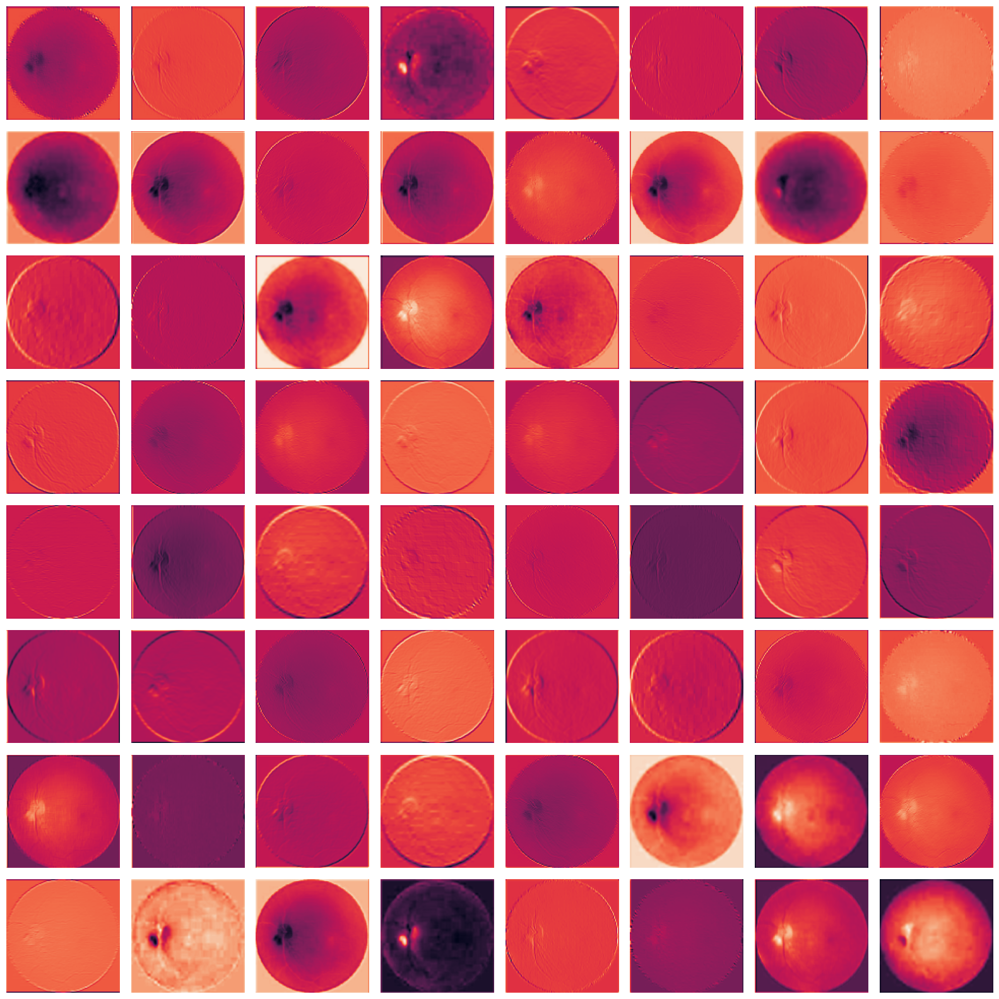

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'conv1/conv'
img_path = '/content/cataract/test/cataract/_30_8983681.jpg'

visualize_activation_maps(model, img_path, layer_name)


# **Prediction**

1/1 [==============================] - 0s 27ms/step


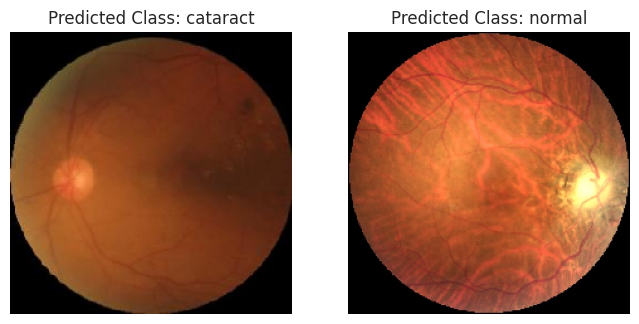

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'normal']

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5'

image_paths = [
    '/content/cataract/test/cataract/_12_5233869.jpg',
    '/content/cataract/test/normal/1253_right.jpg',
]

predict_and_display_images(image_paths, model_path)


# **Image Segmentation**

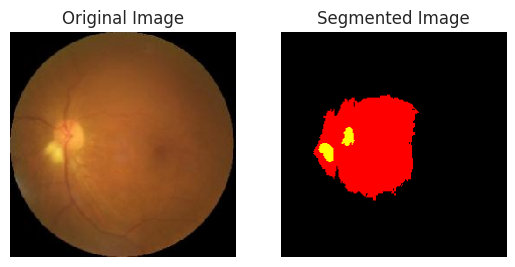

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/cataract/test/cataract/_30_8983681.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.65
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()

# **Computational Tomography**

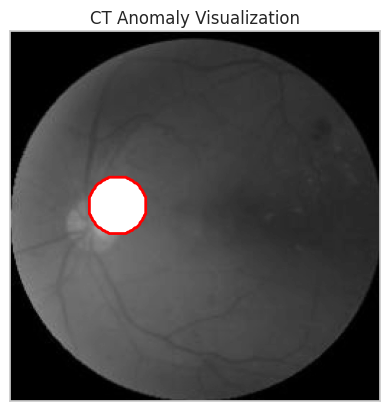

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)

    anomaly_location = (
        np.random.randint(anomaly_size, grayscale_image.shape[0] - anomaly_size),
        np.random.randint(anomaly_size, grayscale_image.shape[1] - anomaly_size)
    )

    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0

    return grayscale_image, anomaly_mask

def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):

    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/cataract/test/cataract/_12_5233869.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


# **InceptionV3**

In [ ]:
base_model = InceptionV3(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(2, activation='sigmoid')(x)

InceptionV3_model = Model(inputs = base_model.input, outputs = output)

InceptionV3_model.compile(Adamax(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

InceptionV3_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


87910968/87910968 [==============================] - 1s 0us/step
Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_217 (Conv2D)         (None, 111, 111, 32)         864       ['input_6[0][0]']             
                                                                                                  
 batch_normalization_220 (B  (None, 111, 111, 32)         96        ['conv2d_217[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_203 (Activation

# **model train**

In [ ]:
start_time = time.time()

history = InceptionV3_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
38/38 [==============================] - ETA: 0s - loss: 6.4266 - accuracy: 0.9249
Epoch 1: val_accuracy improved from -inf to 0.73475, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


38/38 [==============================] - 70s 850ms/step - loss: 6.4266 - accuracy: 0.9249 - val_loss: 5.6769 - val_accuracy: 0.7347
Epoch 2/40
38/38 [==============================] - ETA: 0s - loss: 3.8040 - accuracy: 0.9668
Epoch 2: val_accuracy improved from 0.73475 to 0.94960, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5
38/38 [==============================] - 26s 678ms/step - loss: 3.8040 - accuracy: 0.9668 - val_loss: 3.2741 - val_accuracy: 0.9496
Epoch 3/40
38/38 [==============================] - ETA: 0s - loss: 2.5355 - accuracy: 0.9754
Epoch 3: val_accuracy improved from 0.94960 to 0.96552, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5
38/38 [==============================] - 30s 796ms/step - loss: 2.5355 - accuracy: 0.9754 - val_loss: 2.2126 - val_accuracy: 0.9655
Epoch 4/40
38/38 [==============================] - ETA: 0s - loss: 1.7950 - accuracy: 0.9761
Epoch 4: val_accuracy did not improve from 0.96552
38/38 [============

# **Training , Validation accuracy and loss Visualiztion**

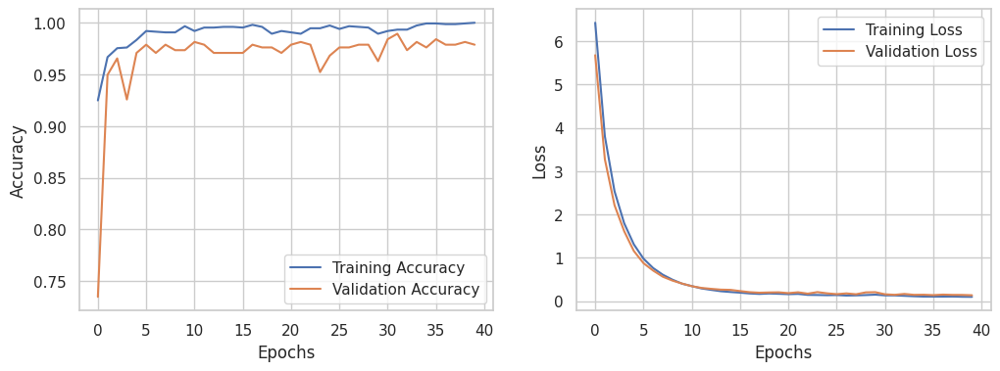

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# **classification report**

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = InceptionV3_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

6/6 [==============================] - 4s 482ms/step
Classification Report:
               precision    recall  f1-score   support

    cataract       0.96      1.00      0.98       110
      normal       1.00      0.97      0.98       121

    accuracy                           0.98       231
   macro avg       0.98      0.98      0.98       231
weighted avg       0.98      0.98      0.98       231



# **confusion matrix**

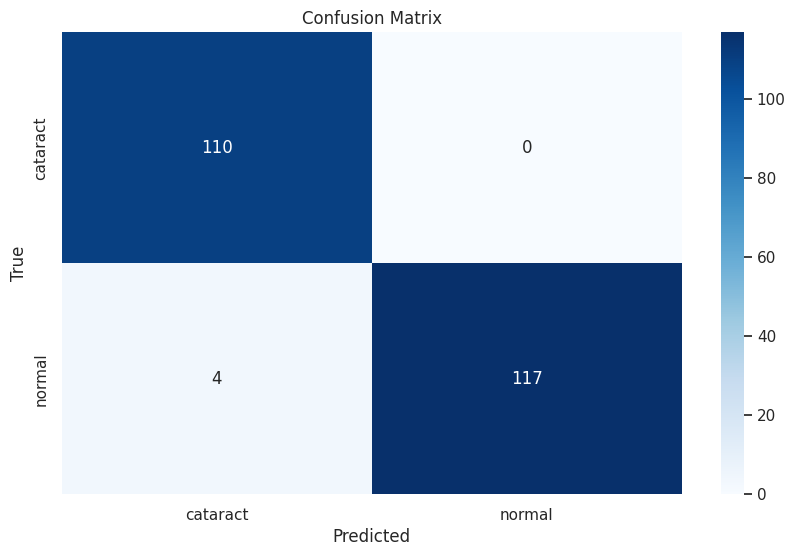

In [ ]:

confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


# **Feture map Visualization**

1/1 [==============================] - 0s 73ms/step


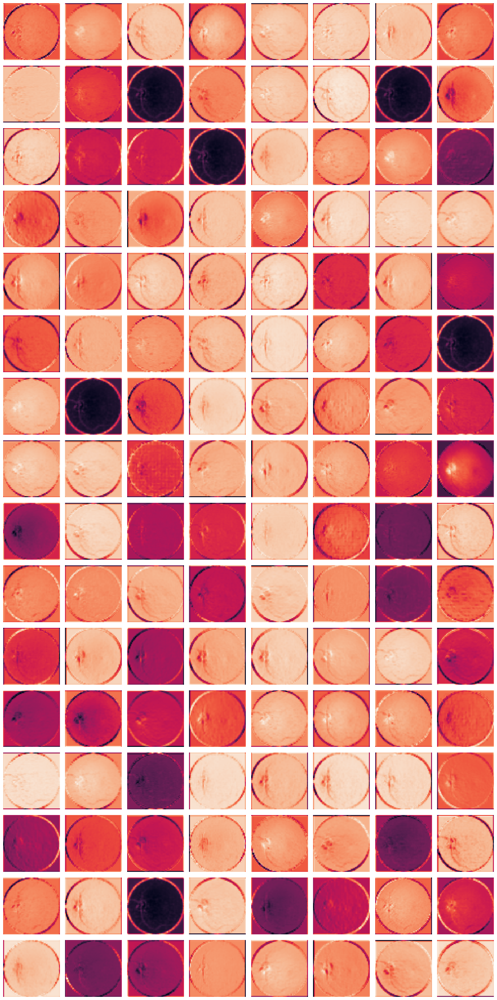

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'conv2_block1_1_bn'
img_path = '/content/cataract/test/cataract/_30_8983681.jpg'

visualize_activation_maps(model, img_path, layer_name)


# **prediction**

1/1 [==============================] - 0s 28ms/step


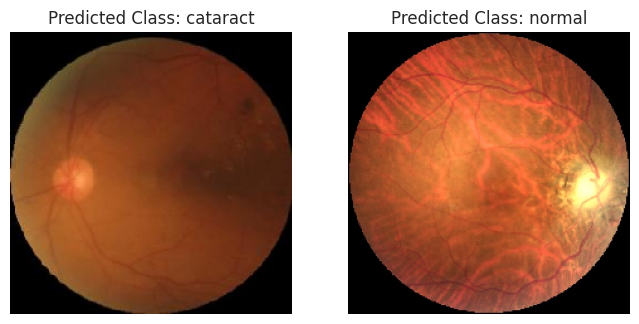

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'normal']

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5'

image_paths = [
    '/content/cataract/test/cataract/_12_5233869.jpg',
    '/content/cataract/test/normal/1253_right.jpg',
]

predict_and_display_images(image_paths, model_path)


# **Image Segmentation**

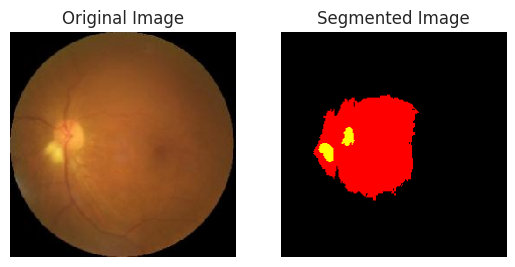

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/cataract/test/cataract/_30_8983681.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.65
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()

# **Computational Tomography**

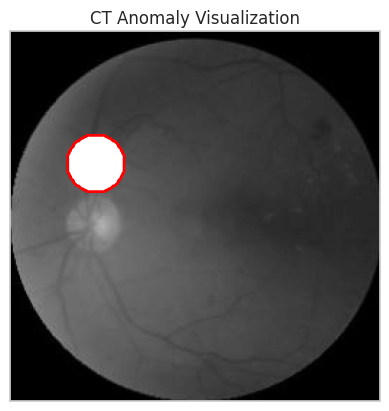

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)

    # Randomly generate anomaly location within the image bounds
    anomaly_location = (
        np.random.randint(anomaly_size, grayscale_image.shape[0] - anomaly_size),
        np.random.randint(anomaly_size, grayscale_image.shape[1] - anomaly_size)
    )

    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0

    return grayscale_image, anomaly_mask

def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    # Create a figure without axes
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/cataract/test/cataract/_12_5233869.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


# **ResNet50V2**

In [ ]:
base_model = ResNet50V2(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(2, activation='sigmoid')(x)

ResNet50V2_model = Model(inputs = base_model.input, outputs = output)

ResNet50V2_model.compile(Adamax(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
ResNet50V2_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


94668760/94668760 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                             

# **Model train**

In [ ]:
start_time = time.time()

history = ResNet50V2_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
38/38 [==============================] - ETA: 0s - loss: 6.3708 - accuracy: 0.9215
Epoch 1: val_accuracy improved from -inf to 0.85942, saving model to /content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


38/38 [==============================] - 67s 835ms/step - loss: 6.3708 - accuracy: 0.9215 - val_loss: 5.4387 - val_accuracy: 0.8594
Epoch 2/40
38/38 [==============================] - ETA: 0s - loss: 3.7389 - accuracy: 0.9641
Epoch 2: val_accuracy improved from 0.85942 to 0.92042, saving model to /content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5
38/38 [==============================] - 22s 584ms/step - loss: 3.7389 - accuracy: 0.9641 - val_loss: 3.2102 - val_accuracy: 0.9204
Epoch 3/40
38/38 [==============================] - ETA: 0s - loss: 2.4525 - accuracy: 0.9754
Epoch 3: val_accuracy improved from 0.92042 to 0.94430, saving model to /content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5
38/38 [==============================] - 24s 619ms/step - loss: 2.4525 - accuracy: 0.9754 - val_loss: 2.1438 - val_accuracy: 0.9443
Epoch 4/40
38/38 [==============================] - ETA: 0s - loss: 1.7162 - accuracy: 0.9754
Epoch 4: val_accuracy did not improve from 0.94430
38/38 [==============

# **Training , Validation accuracy and loss Visualiztion**

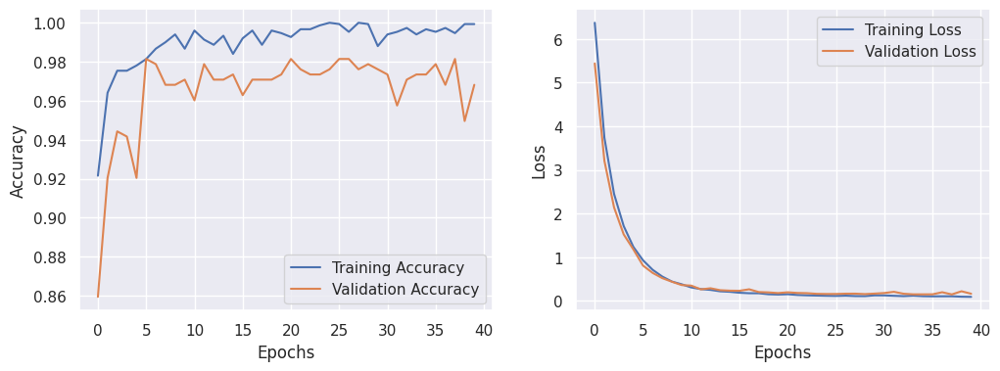

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# **classification report**

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = ResNet50V2_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

6/6 [==============================] - 4s 562ms/step
Classification Report:
               precision    recall  f1-score   support

    cataract       0.90      1.00      0.95       110
      normal       1.00      0.90      0.95       121

    accuracy                           0.95       231
   macro avg       0.95      0.95      0.95       231
weighted avg       0.95      0.95      0.95       231



# **confusion matrix**

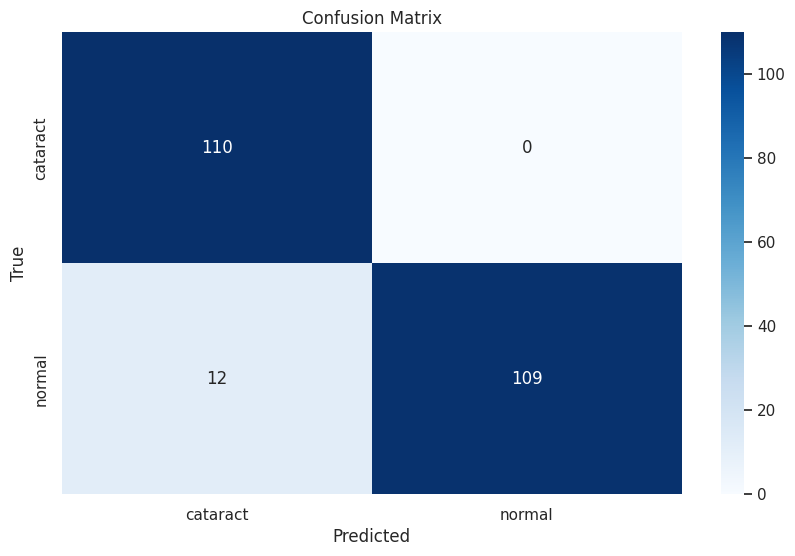

In [ ]:

confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


# **Feature Map Visualization**

1/1 [==============================] - 0s 41ms/step


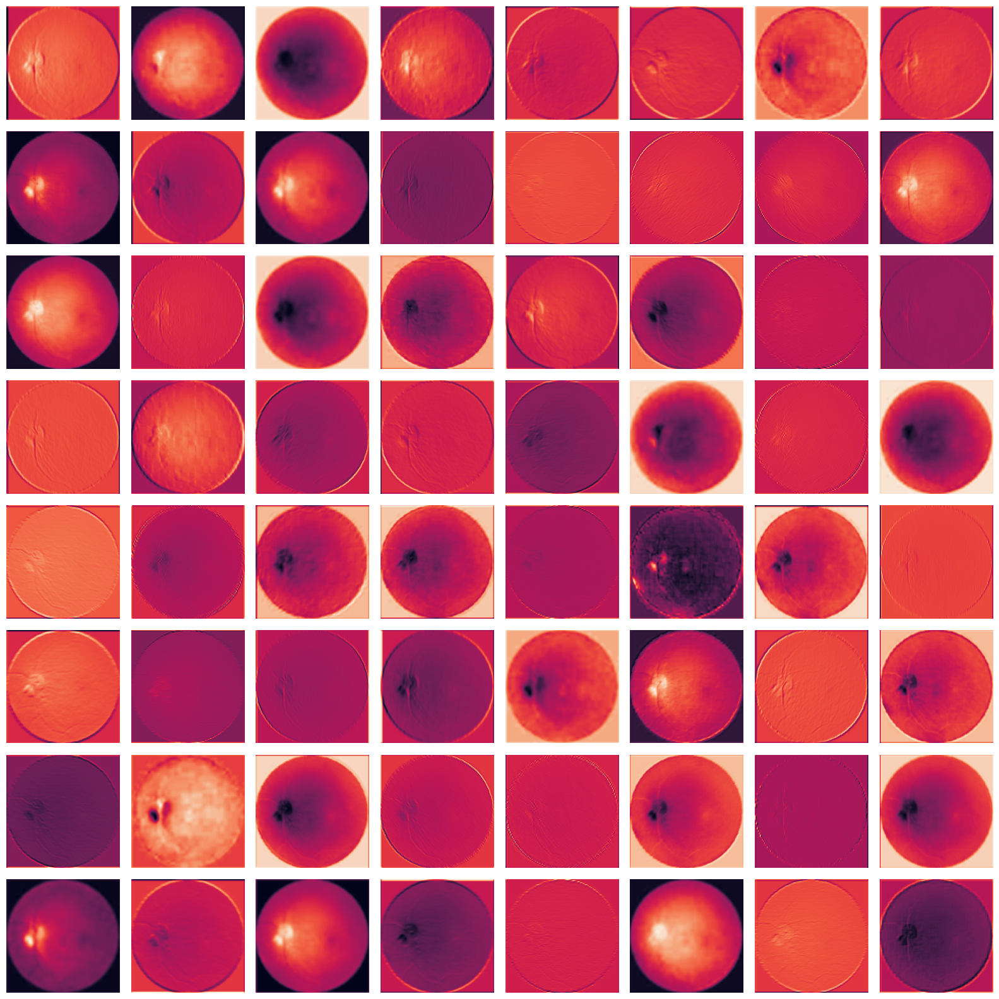

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'conv1_conv'
img_path = '/content/cataract/test/cataract/_30_8983681.jpg'

visualize_activation_maps(ResNet50V2_model, img_path, layer_name)


# **Prediction**

1/1 [==============================] - 0s 35ms/step


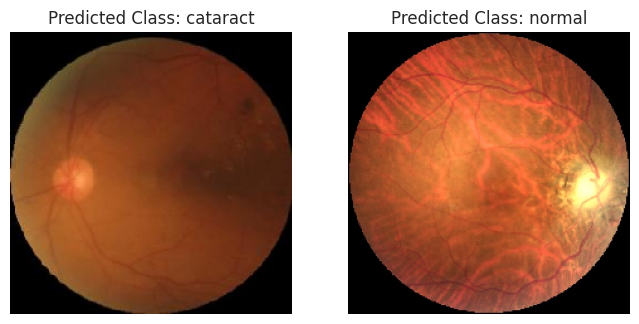

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'normal']

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5'

image_paths = [
    '/content/cataract/test/cataract/_12_5233869.jpg',
    '/content/cataract/test/normal/1253_right.jpg',
]

predict_and_display_images(image_paths, model_path)


# **Attention Map**

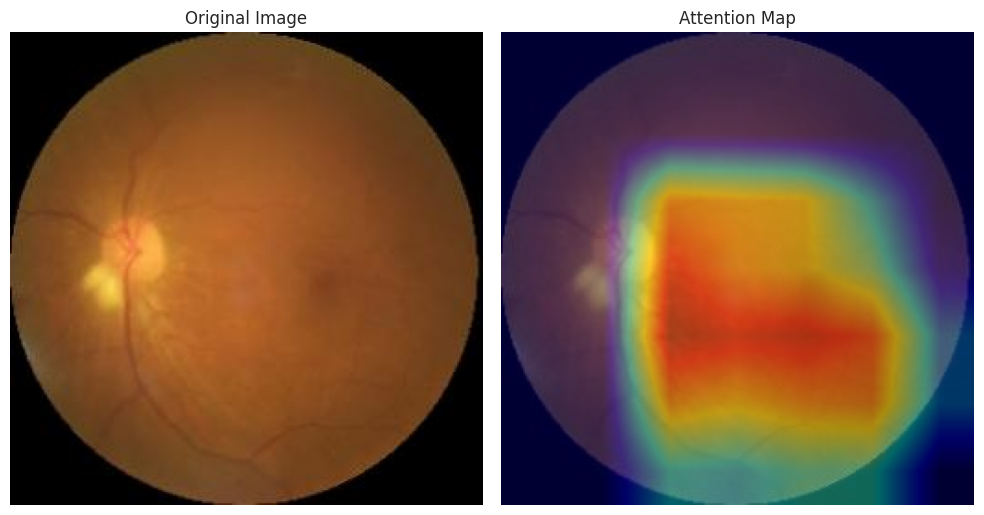

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

def get_gradcam(model, img_path, layer_name):
    image = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    image_array = tf.keras.preprocessing.image.img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0) / 255.0

    grad_model = tf.keras.models.Model(inputs=[model.input],
                                       outputs=[model.get_layer(layer_name).output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image_array)
        loss = predictions[:, tf.argmax(predictions[0])]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap

def visualize_attention(image_path, heatmap):
    image = cv2.imread(image_path)
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_image = cv2.addWeighted(image, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(superimposed_image, cv2.COLOR_BGR2RGB))
    plt.title('Attention Map')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5'
model_2 = tf.keras.models.load_model(model_path)

image_path = '/content/cataract/test/cataract/_30_8983681.jpg'
layer_name = 'conv5_block3_3_conv'

heatmap = get_gradcam(model_2, image_path, layer_name)
visualize_attention(image_path, heatmap)


# **Image Segmentation**

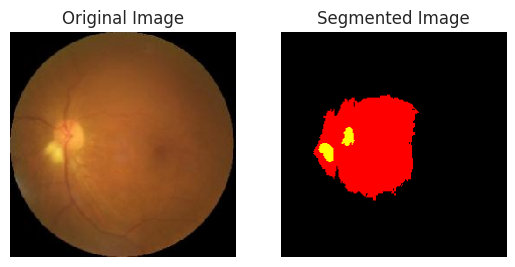

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/cataract/test/cataract/_30_8983681.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.65
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()

# **Computational Tomography**

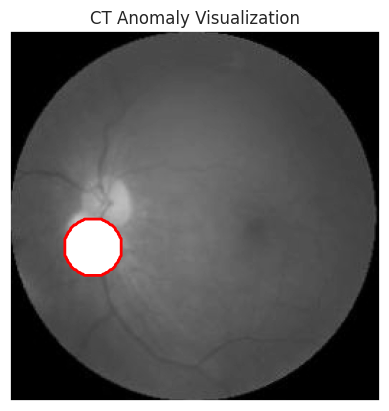

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)

    anomaly_location = (
        np.random.randint(anomaly_size, grayscale_image.shape[0] - anomaly_size),
        np.random.randint(anomaly_size, grayscale_image.shape[1] - anomaly_size)
    )

    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0

    return grayscale_image, anomaly_mask

def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    # Create a figure without axes
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/cataract/test/cataract/_30_8983681.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


# **Ensemble model By Averging**

In [ ]:
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Average
model1 = load_model('/content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5')
model1 = Model(inputs=model1.inputs, outputs=model1.outputs, name='DenseNet169')
model2 = load_model('/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5')
model2 = Model(inputs=model2.inputs, outputs=model2.outputs, name='InceptionResNetV2')
model3 = load_model('/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5')
model3 = Model(inputs=model3.inputs, outputs=model3.outputs, name='Xception')
model4 = load_model('/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5')
model4 = Model(inputs=model4.inputs, outputs=model4.outputs, name='InceptionV3')
model5 = load_model('/content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5')
model5 = Model(inputs=model5.inputs, outputs=model5.outputs, name='ResNet50V2')
models = [model1, model2, model3, model4, model5]
model_input = Input(shape=(224, 224, 3))
model_outputs = [model(model_input) for model in models]
ensemble_output = Average()(model_outputs)
ensemble_model = Model(inputs=model_input, outputs=ensemble_output, name='ensemble')
ensemble_model.summary()
ensemble_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
accuracy = ensemble_model.evaluate(test_set)
print(f'Ensemble Model Accuracy: {accuracy[1]}')

Model: "ensemble"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 DenseNet169 (Functional)    (None, 2)                    1307629   ['input_3[0][0]']             
                                                          0                                       
                                                                                                  
 InceptionResNetV2 (Functio  (None, 2)                    5473686   ['input_3[0][0]']             
 nal)                                                     6                                       
                                                                                           

# **classification report For Ensemble Model**

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = ensemble_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

6/6 [==============================] - 14s 628ms/step
Classification Report:
               precision    recall  f1-score   support

    cataract       0.96      1.00      0.98       110
      normal       1.00      0.96      0.98       121

    accuracy                           0.98       231
   macro avg       0.98      0.98      0.98       231
weighted avg       0.98      0.98      0.98       231



In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout

# Define the AlexNet model
def create_alexnet(input_shape):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(96, (11, 11), strides=(4, 4), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2, 2)))
    model.add(BatchNormalization())

    # Layer 2
    model.add(Conv2D(256, (5, 5), padding='same', activation='relu'))
    model.add(MaxPooling2D((3, 3), strides=(2, 2)))
    model.add(BatchNormalization())

    # Layer 3
    model.add(Conv2D(384, (3, 3), padding='same', activation='relu'))
    model.add(BatchNormalization())

    # Layer 4
    model.add(Conv2D(384, (3, 3), padding='same', activation='relu'))
    model.add(BatchNormalization())

    # Layer 5
    model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
    model.add(MaxPooling2D((3, 3), strides=(2, 2)))
    model.add(BatchNormalization())

    # Flatten
    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(BatchNormalization())

    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(BatchNormalization())

    # Output layer
    model.add(Dense(2, activation='sigmoid'))

    return model

# Example usage
input_shape = (224, 224, 3)  # Adjust the input shape based on your requirements
alexnet_model = create_alexnet(input_shape)

# Compile the model
alexnet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model summary
alexnet_model.summary()




checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/AlexNet_Improved.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 54, 54, 96)        34944     
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 26, 26, 96)        0         
 ng2D)                                                           
                                                                 
 batch_normalization_25 (Ba  (None, 26, 26, 96)        384       
 tchNormalization)                                               
                                                                 
 conv2d_21 (Conv2D)          (None, 26, 26, 256)       614656    
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 12, 12, 256)       0         
 ng2D)                                                           
                                                      

In [ ]:
start_time = time.time()

history = alexnet_model.fit( train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
38/38 [==============================] - ETA: 0s - loss: 0.9358 - accuracy: 0.6975
Epoch 1: val_accuracy improved from -inf to 0.50663, saving model to /content/drive/MyDrive/Colab_Notebooks/AlexNet_Improved.h5
38/38 [==============================] - 28s 634ms/step - loss: 0.9358 - accuracy: 0.6975 - val_loss: 219.4218 - val_accuracy: 0.5066
Epoch 2/40
38/38 [==============================] - ETA: 0s - loss: 0.4358 - accuracy: 0.8245
Epoch 2: val_accuracy improved from 0.50663 to 0.58355, saving model to /content/drive/MyDrive/Colab_Notebooks/AlexNet_Improved.h5
38/38 [==============================] - 23s 620ms/step - loss: 0.4358 - accuracy: 0.8245 - val_loss: 8.4824 - val_accuracy: 0.5836
Epoch 3/40
38/38 [==============================] - ETA: 0s - loss: 0.3739 - accuracy: 0.8511
Epoch 3: val_accuracy improved from 0.58355 to 0.64456, saving model to /content/drive/MyDrive/Colab_Notebooks/AlexNet_Improved.h5
38/38 [==============================] - 21s 551ms/step - loss

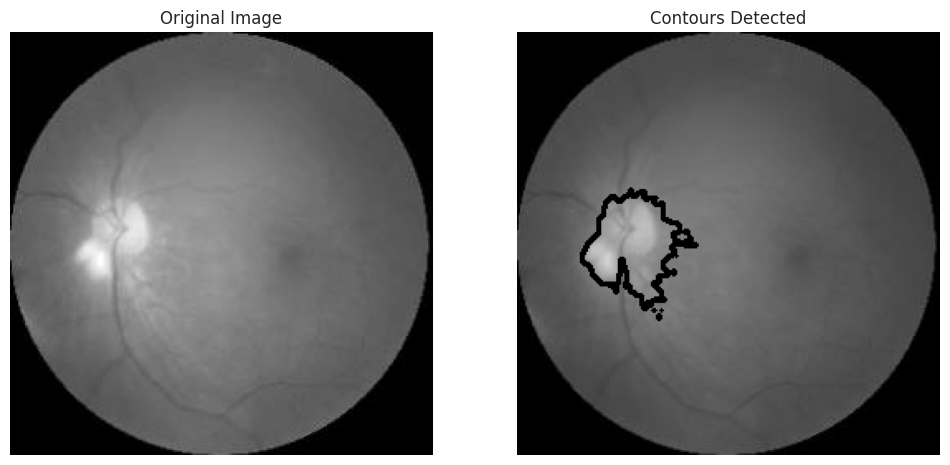

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread('/content/cataract/test/cataract/_30_8983681.jpg', cv2.IMREAD_GRAYSCALE)

# Apply thresholding to obtain a binary image
_, binary_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)

# Find contours in the binary image
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
contour_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
cv2.drawContours(contour_image, contours, -1, (0, 0, 0), 2)

# Display the results without graph lines
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(contour_image)
plt.title('Contours Detected')
plt.axis('off')

plt.show()


Accuracy: 0.90


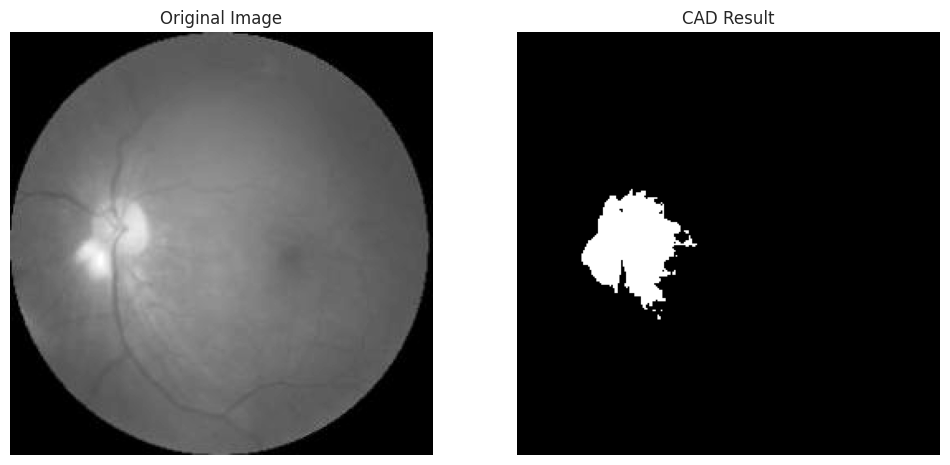

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from skimage import color, io

# Load an example image
image = cv2.imread('/content/cataract/test/cataract/_30_8983681.jpg', cv2.IMREAD_GRAYSCALE)

# Apply preprocessing (e.g., image enhancement and noise reduction)

# Simulate image segmentation (for demonstration purposes)
_, binary_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)

# Simulate feature extraction (for demonstration purposes)
features = binary_image.flatten().reshape(-1, 1)

# Simulate classification (using RandomForestClassifier as an example)
labels = np.random.choice([0, 1], size=(features.shape[0],), p=[0.9, 0.1])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train the classifier
classifier = RandomForestClassifier(n_estimators=100, random_state=42)
classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = classifier.predict(X_test)

# Evaluate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Display the original image and CAD result
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('CAD Result')
plt.axis('off')

plt.show()


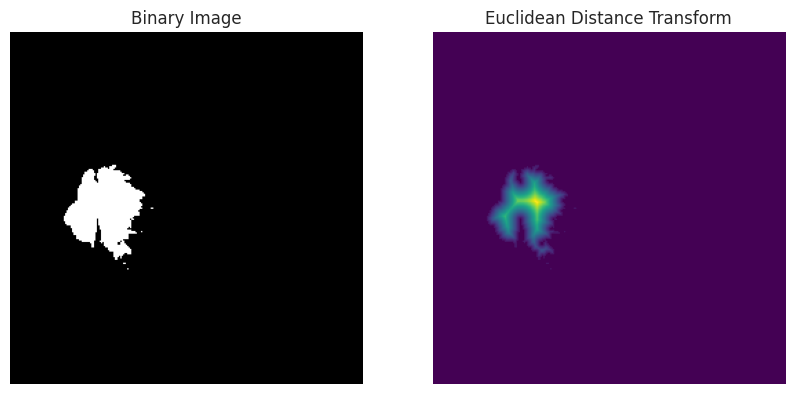

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt
from skimage import io, color

# Load a binary image
image_path = '/content/cataract/test/cataract/_30_8983681.jpg'
binary_image = io.imread(image_path, as_gray=True)

# Ensure the image is binary (threshold if necessary)
binary_image = (binary_image > 0.5).astype(np.uint8)

# Compute the Euclidean Distance Transform
distance_transform = distance_transform_edt(binary_image)

# Visualize the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(distance_transform, cmap='viridis')
plt.title('Euclidean Distance Transform')
plt.axis('off')

plt.show()


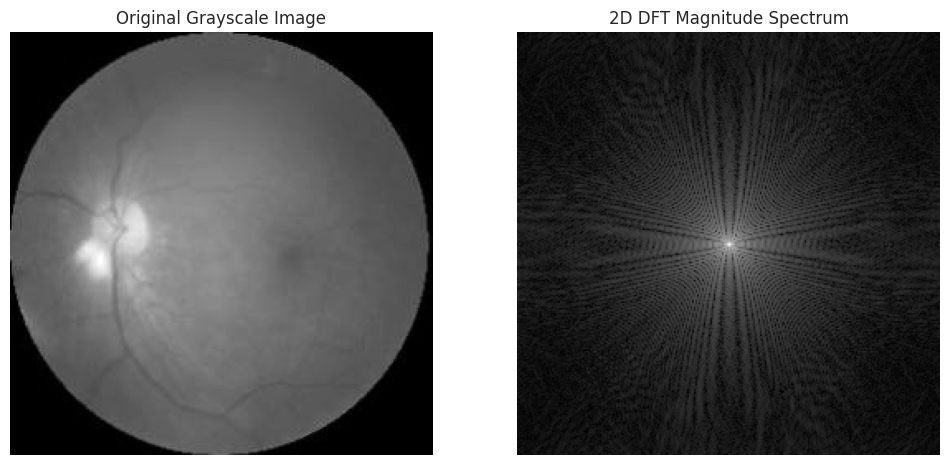

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

# Load a sample image (you can replace it with your own image)
image_path = '/content/cataract/test/cataract/_30_8983681.jpg'
image = io.imread(image_path)

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

# Compute the 2D DFT using FFT
dft_result = np.fft.fft2(gray_image)
dft_shifted = np.fft.fftshift(dft_result)

# Compute the magnitude spectrum (logarithmic scale for better visualization)
magnitude_spectrum = np.log(np.abs(dft_shifted) + 1)

# Visualize the original image and its DFT magnitude spectrum
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('2D DFT Magnitude Spectrum')
plt.axis('off')

plt.show()


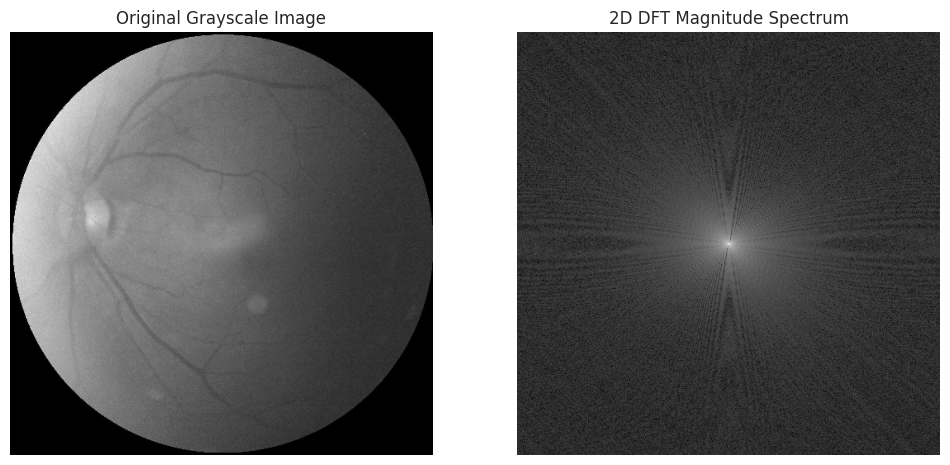

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

# Load a sample image (you can replace it with your own image)
image_path = '/content/cataract/test/normal/2332_left.jpg'
image = io.imread(image_path)

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

# Compute the 2D DFT using FFT
dft_result = np.fft.fft2(gray_image)
dft_shifted = np.fft.fftshift(dft_result)

# Compute the magnitude spectrum (logarithmic scale for better visualization)
magnitude_spectrum = np.log(np.abs(dft_shifted) + 1)

# Visualize the original image and its DFT magnitude spectrum
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('2D DFT Magnitude Spectrum')
plt.axis('off')

plt.show()


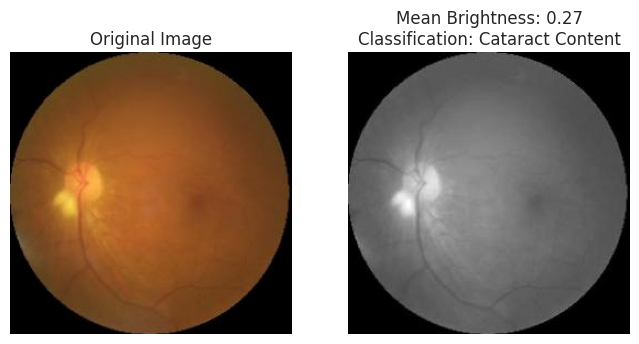

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

# Load a sample image (replace it with your own)
image_path = '/content/cataract/test/cataract/_30_8983681.jpg'
image = io.imread(image_path)

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

# Calculate the mean brightness as a simple feature
mean_brightness = np.mean(gray_image)

# Define a threshold to classify images
threshold = 0.5  # Adjust as needed

# Classify based on mean brightness
classification_result = "Cataract Content" if mean_brightness < threshold else "Normal Eye Retinal Image"

# Visualize the image and print the classification result
plt.figure(figsize=(8, 8))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title(f'Mean Brightness: {mean_brightness:.2f}\nClassification: {classification_result}')
plt.axis('off')

plt.show()


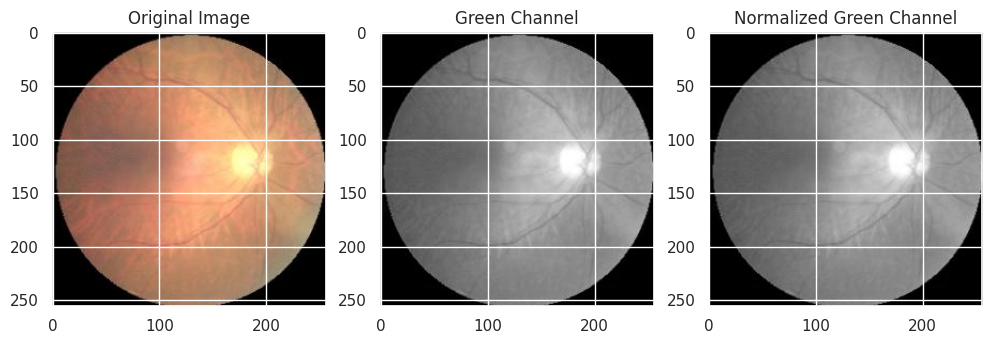

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

# Load a sample image (replace it with your own)
image_path = '/content/cataract/test/cataract/_13_3987009.jpg'
image = io.imread(image_path)

# Extract the green channel
green_channel = image[:, :, 1]  # Green channel is at index 1 (0-based indexing)

# Normalize the intensity values to the range [0, 1]
normalized_green_channel = (green_channel - np.min(green_channel)) / (np.max(green_channel) - np.min(green_channel))

# Visualize the original image, green channel, and normalized green channel
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(green_channel, cmap='gray')
plt.title('Green Channel')

plt.subplot(1, 3, 3)
plt.imshow(normalized_green_channel, cmap='gray')
plt.title('Normalized Green Channel')

plt.show()
